# Compare the v3.2 recalibrated SDSS Stripe82 catalog 
# and Pan-STARRS1 catalog

### use the SDSS g-i color and linear interpolation for bandpass transformations 

[Link to helper tools](#dataTools) 

[Link to data reading](#dataReading) 

[Link to data analysis](#dataAnalysis) 

In [ ]:
%matplotlib inline
from astropy.table import Table
from astropy.coordinates import SkyCoord
from astropy import units as u
from astropy.table import hstack
import matplotlib.pyplot as plt 
import numpy as np
from astroML.plotting import hist
# for astroML installation see https://www.astroml.org/user_guide/installation.html

In [2]:
## automatically reload any modules read below that might have changed (e.g. plots)
%load_ext autoreload
%autoreload 2
# importing ZI tools: 
import ZItools as zit

<a id='dataTools'></a>

### Helper Tools

In [6]:
# robust standard deviation
def sigG(arr):
    return 0.741*(np.quantile(arr, 0.75)-np.quantile(arr, 0.25))

In [10]:
### code for generating new quantities, such as dra, ddec, colors, differences in mags, etc
def derivedColumns(matches):
    matches['dra'] = (matches['ra']-matches['raPS'])*3600
    matches['ddec'] = (matches['dec']-matches['decPS'])*3600
    ra = matches['ra'] 
    matches['raW'] = np.where(ra > 180, ra-360, ra) 
    matches['dg'] = matches['g_mMed'] - matches['gPS'] 
    matches['dr'] = matches['r_mMed'] - matches['rPS'] 
    matches['di'] = matches['i_mMed'] - matches['iPS'] 
    matches['dz'] = matches['z_mMed'] - matches['zPS'] 
    matches['gr'] = matches['g_mMed'] - matches['r_mMed']
    matches['ri'] = matches['r_mMed'] - matches['i_mMed']
    matches['gi'] = matches['g_mMed'] - matches['i_mMed']
    matches['iz'] = matches['i_mMed'] - matches['z_mMed']
    matches['rz'] = matches['r_mMed'] - matches['z_mMed']
    matches['dgr'] = matches['dg'] - matches['dr'] 
    matches['dri'] = matches['dr'] - matches['di'] 
    matches['diz'] = matches['di'] - matches['dz'] 
    matches['drz'] = matches['dr'] - matches['dz'] 
    matches['dgi'] = matches['dg'] - matches['di'] 
    return

In [34]:
def doOneColor(d, kw):
    print('=========== WORKING ON:', kw['Ystr'], '===================')
    xVec = d[kw['Xstr']]
    yVec = d[kw['Ystr']]
    # 
    xBin, nPts, medianBin, sigGbin = zit.fitMedians(xVec, yVec, 0.5, 3.1, 52, 0)
    fig,ax = plt.subplots(1,1,figsize=(8,6))
    ax.scatter(xVec, yVec, s=0.01, c='blue')
    ax.scatter(xBin, medianBin, s=5.2, c='yellow')
    ax.set_xlim(0.4,3.2)
    ax.set_ylim(-0.5,0.5)
    ax.set_xlabel(kw['Xstr'])
    ax.set_ylabel(kw['Ystr'])
    d['colorfit'] = np.interp(xVec, xBin, medianBin)
    d['colorresid'] = d[kw['Ystr']] - d['colorfit'] 
    goodC = d[np.abs(d['colorresid'])<0.3]
    
    ### plots 
    # RA
    print(' stats for RA binning medians:')
    plotNameRoot = kw['plotNameRoot'] + kw['Ystr']
    plotName = plotNameRoot + '_RA.png'
    Ylabel =kw['Ystr'] + ' residuals'
    kwOC = {"Xstr":'raW', "Xmin":-52, "Xmax":60.5, "Xlabel":'R.A. (deg)', \
          "Ystr":'colorresid', "Ymin":-0.07, "Ymax":0.07, "Ylabel":Ylabel, \
          "XminBin":-51.5, "XmaxBin":58, "nBin":56, \
          "plotName":plotName, "Nsigma":3, "offset":0.01, "symbSize":kw['symbSize']}
    zit.plotdelMag(goodC, kwOC)
    print('made plot', plotName)
    # Dec
    print('-----------')
    print(' stats for Dec binning medians:')
    plotName = plotNameRoot + '_Dec.png'
    kwOC = {"Xstr":'dec', "Xmin":-1.3, "Xmax":1.3, "Xlabel":'Declination (deg)', \
          "Ystr":'colorresid', "Ymin":-0.07, "Ymax":0.07, "Ylabel":Ylabel, \
          "XminBin":-1.26, "XmaxBin":1.26, "nBin":52, \
          "plotName":plotName, "Nsigma":3, "offset":0.01, "symbSize":kw['symbSize']}
    zit.plotdelMag(goodC, kwOC)
    print('made plot', plotName)
    # r SDSS
    print('-----------')
    print(' stats for SDSS r binning medians:')
    plotName = plotNameRoot + '_rmag.png'    
    kwOC = {"Xstr":'r_mMed', "Xmin":14.3, "Xmax":22.2, "Xlabel":'SDSS r (mag)', \
          "Ystr":'colorresid', "Ymin":-0.07, "Ymax":0.07, "Ylabel":Ylabel, \
          "XminBin":14.5, "XmaxBin":21.5, "nBin":55, \
          "plotName":plotName, "Nsigma":3, "offset":0.01, "symbSize":kw['symbSize']}
    zit.plotdelMag(goodC, kwOC)
    print('made plot', plotName)
    print('------------------------------------------------------------------')
   

<a id='dataReading'></a>

### Define paths and catalogs 

In [7]:
ZIdataDir = "/Users/ivezic/Work/Science/CalibrationV2/Data"
# Karun's match of v3.2 and Pan-STARRS catalog (from Doug)
PScatalog = ZIdataDir + "/" + "nSSC2PS1_matched.csv" 
colnamesSDSSPS = ['ra', 'dec', 'nEpochs',   
                'g_Nobs', 'g_mMed', 'g_mErr', 
                'r_Nobs', 'r_mMed', 'r_mErr',  
                'i_Nobs', 'i_mMed', 'i_mErr',  
                'z_Nobs', 'z_mMed', 'z_mErr', 
                'raPS', 'decPS', 
                'gPS', 'gErrPS', 'gNobsPS',
                'rPS', 'rErrPS', 'rNobsPS',
                'iPS', 'iErrPS', 'iNobsPS',
                'zPS', 'zErrPS', 'zNobsPS']

In [9]:
sdssPS = Table.read(PScatalog, format='csv', names=colnamesSDSSPS) 
print(np.size(sdssPS))

943185


In [11]:
derivedColumns(sdssPS)

=========== WORKING ON: dg ===================
 stats for RA binning medians:
medianAll: -0.002236000000003055 std.dev.All: 0.03388444799999986
N= 891803 min= -0.2999299999999988 max= 0.2999980000000009
median: -0.00257900000000035 std.dev: 0.0027621383323600418
saved plot as: colorResidPS_dg_RA.png


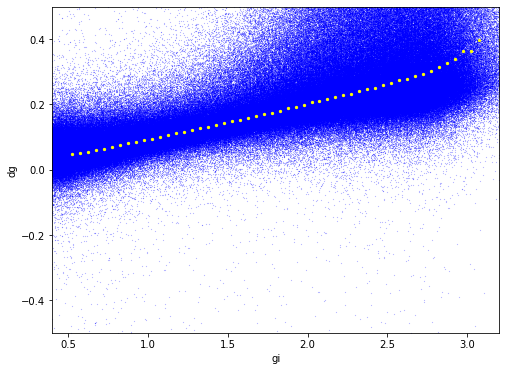

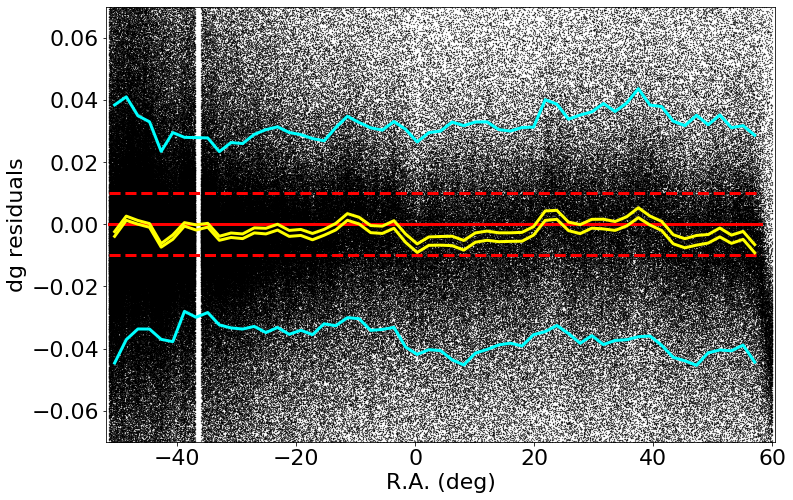

made plot colorResidPS_dg_RA.png
-----------
 stats for Dec binning medians:
medianAll: -0.002236000000003055 std.dev.All: 0.03388444799999986
N= 891803 min= -0.2999299999999988 max= 0.2999980000000009
median: -0.0020500000000013008 std.dev: 0.0010827229335399024
saved plot as: colorResidPS_dg_Dec.png


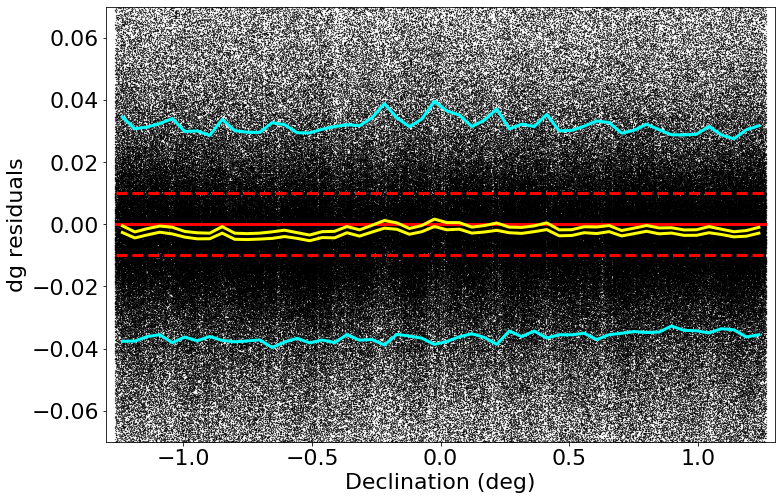

made plot colorResidPS_dg_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: -0.002236000000003055 std.dev.All: 0.03388444799999986
N= 891803 min= -0.2999299999999988 max= 0.2999980000000009
median: -0.005851000000000887 std.dev: 0.04315649462343205
saved plot as: colorResidPS_dg_rmag.png


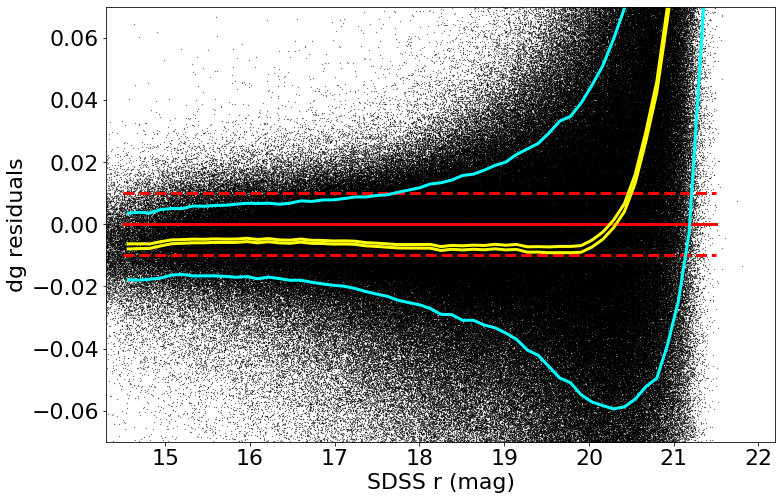

made plot colorResidPS_dg_rmag.png
------------------------------------------------------------------
=========== WORKING ON: dr ===================
 stats for RA binning medians:
medianAll: 0.00020999999999951656 std.dev.All: 0.01889698200000232
N= 941105 min= -0.29990000000000094 max= 0.29998000000000113
median: 0.00017100000000202066 std.dev: 0.0026861763847806034
saved plot as: colorResidPS_dr_RA.png


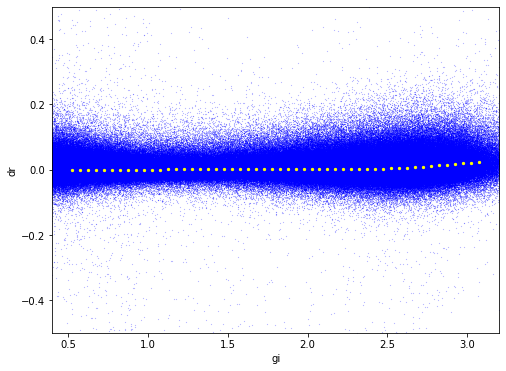

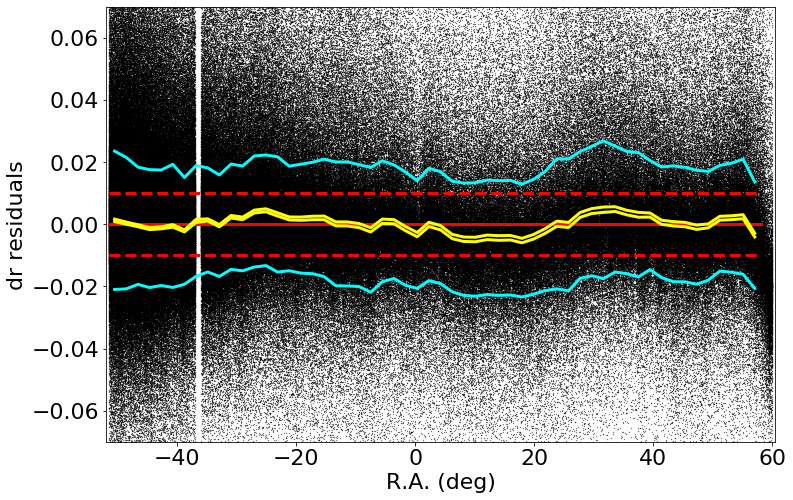

made plot colorResidPS_dr_RA.png
-----------
 stats for Dec binning medians:
medianAll: 0.00020999999999951656 std.dev.All: 0.01889698200000232
N= 941105 min= -0.29990000000000094 max= 0.29998000000000113
median: 0.00010150000000028642 std.dev: 0.0007735663787341522
saved plot as: colorResidPS_dr_Dec.png


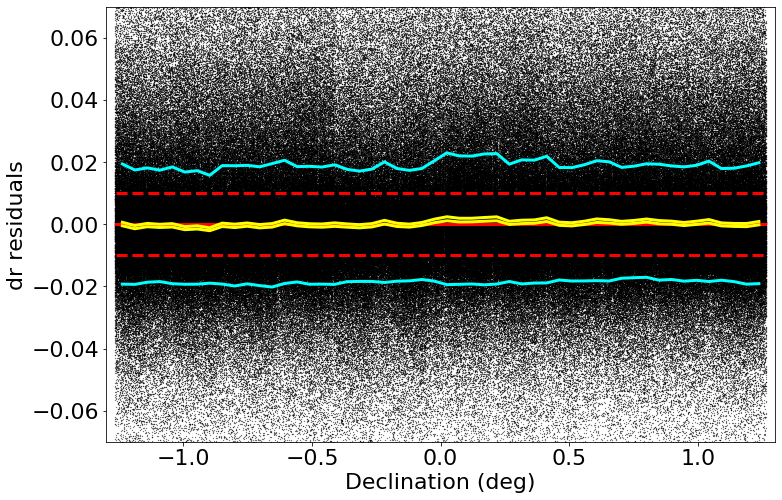

made plot colorResidPS_dr_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: 0.00020999999999951656 std.dev.All: 0.01889698200000232
N= 941105 min= -0.29990000000000094 max= 0.29998000000000113
median: -0.001995999999998454 std.dev: 0.009554550686271538
saved plot as: colorResidPS_dr_rmag.png


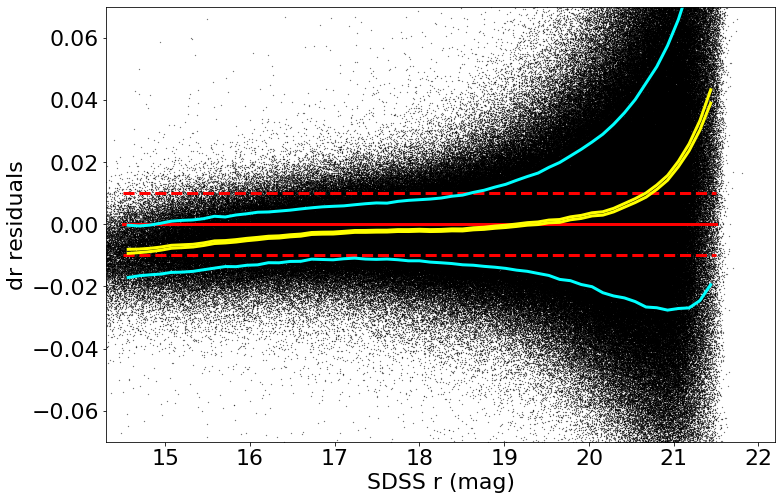

made plot colorResidPS_dr_rmag.png
------------------------------------------------------------------
=========== WORKING ON: di ===================
 stats for RA binning medians:
medianAll: 0.0002500000000012154 std.dev.All: 0.01417532999999948
N= 940977 min= -0.2998999999999982 max= 0.29995200000000083
median: 0.00044600000000055186 std.dev: 0.002008035334037089
saved plot as: colorResidPS_di_RA.png


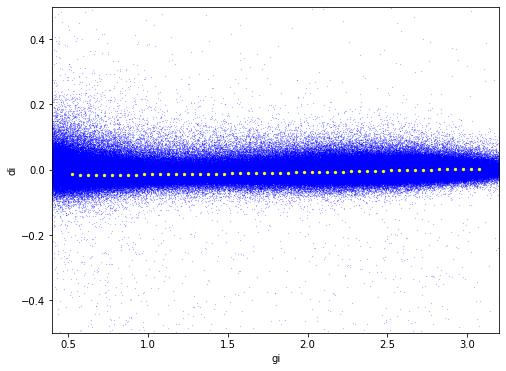

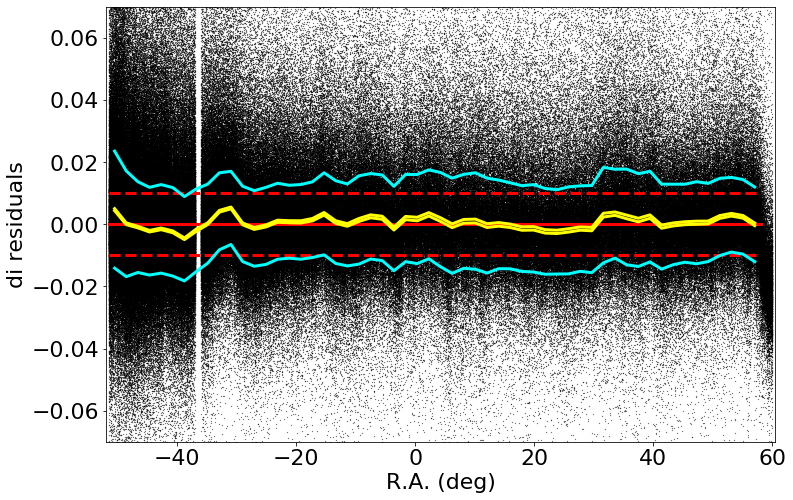

made plot colorResidPS_di_RA.png
-----------
 stats for Dec binning medians:
medianAll: 0.0002500000000012154 std.dev.All: 0.01417532999999948
N= 940977 min= -0.2998999999999982 max= 0.29995200000000083
median: 0.00023449999999971107 std.dev: 0.0008268270322131434
saved plot as: colorResidPS_di_Dec.png


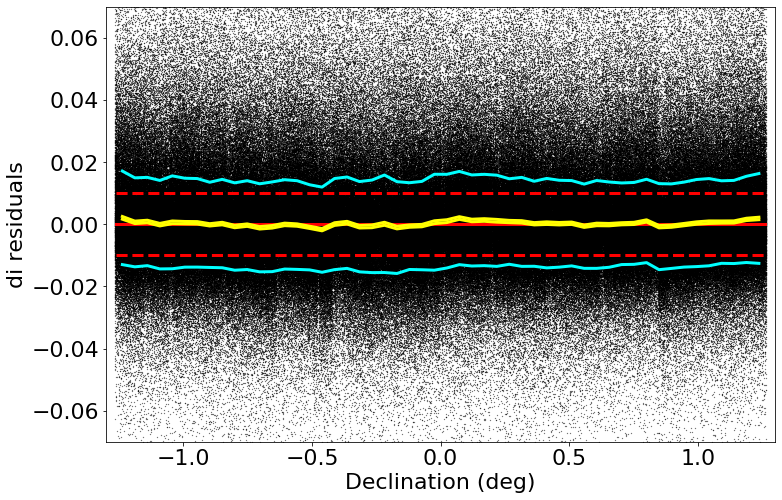

made plot colorResidPS_di_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: 0.0002500000000012154 std.dev.All: 0.01417532999999948
N= 940977 min= -0.2998999999999982 max= 0.29995200000000083
median: -0.0008000000000016882 std.dev: 0.00420249483690558
saved plot as: colorResidPS_di_rmag.png


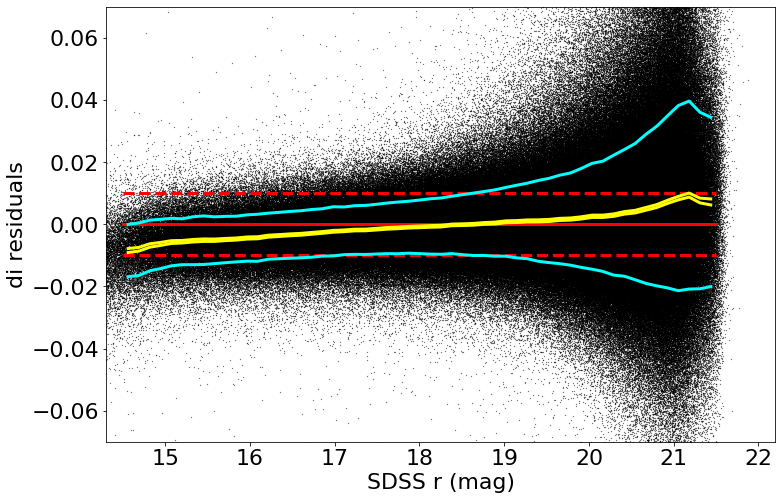

made plot colorResidPS_di_rmag.png
------------------------------------------------------------------
=========== WORKING ON: dz ===================
 stats for RA binning medians:
medianAll: 9.600000000008213e-05 std.dev.All: 0.022286315999999386
N= 937165 min= -0.2998000000000012 max= 0.2998999999999974
median: -0.0003120000000015506 std.dev: 0.005850553138906654
saved plot as: colorResidPS_dz_RA.png


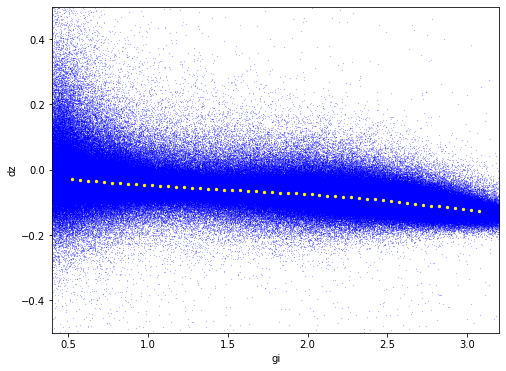

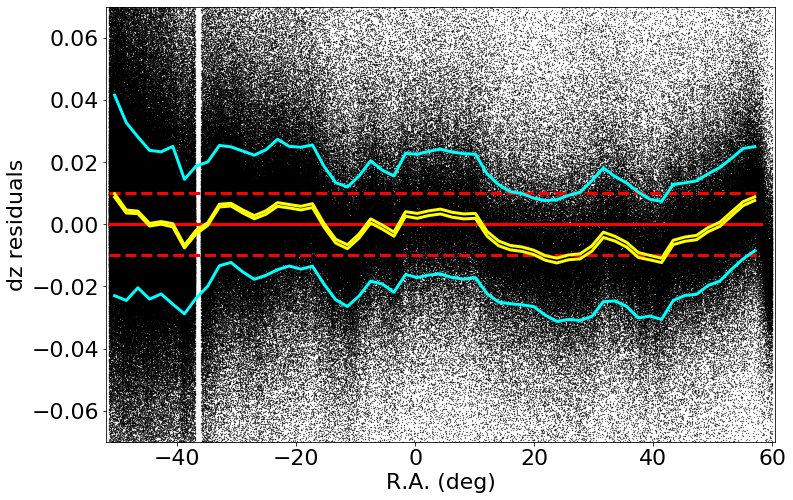

made plot colorResidPS_dz_RA.png
-----------
 stats for Dec binning medians:
medianAll: 9.600000000008213e-05 std.dev.All: 0.022286315999999386
N= 937165 min= -0.2998000000000012 max= 0.2998999999999974
median: 0.00023100000000159972 std.dev: 0.0015304463578852741
saved plot as: colorResidPS_dz_Dec.png


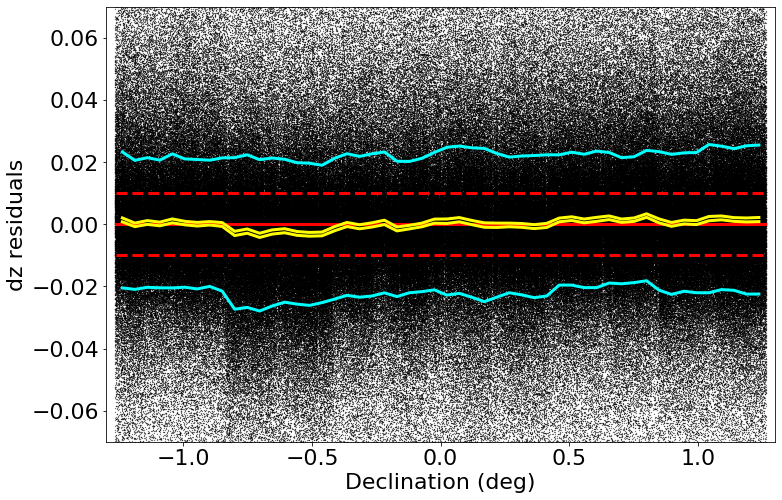

made plot colorResidPS_dz_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: 9.600000000008213e-05 std.dev.All: 0.022286315999999386
N= 937165 min= -0.2998000000000012 max= 0.2998999999999974
median: -0.00014400000000019259 std.dev: 0.0019908792691832483
saved plot as: colorResidPS_dz_rmag.png


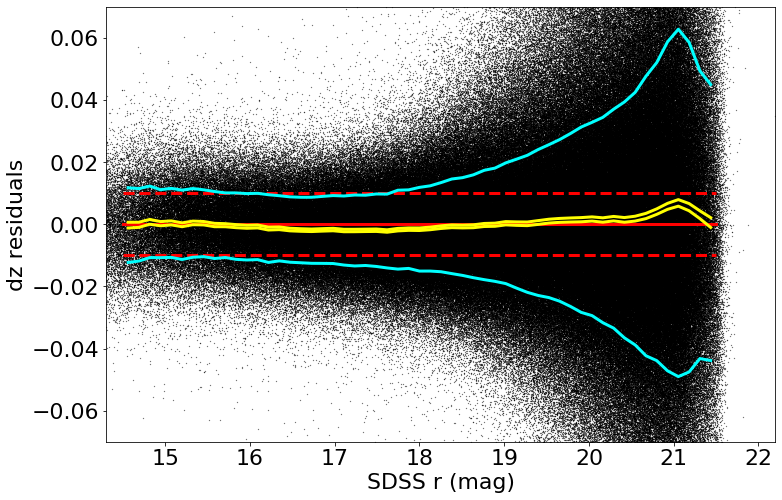

made plot colorResidPS_dz_rmag.png
------------------------------------------------------------------
=========== WORKING ON: dgr ===================
 stats for RA binning medians:
medianAll: -0.00245199999999917 std.dev.All: 0.034324602000003694
N= 897590 min= -0.29999999999999716 max= 0.29999999999999766
median: -0.003412500000000776 std.dev: 0.00286555774123763
saved plot as: colorResidPS_dgr_RA.png


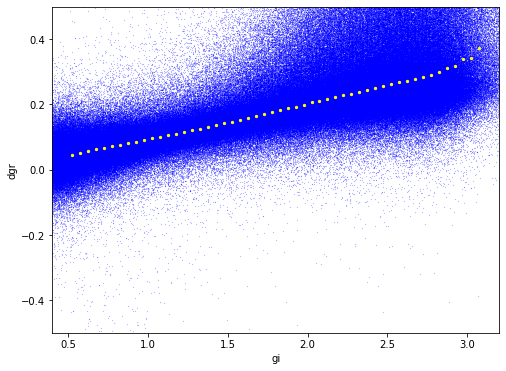

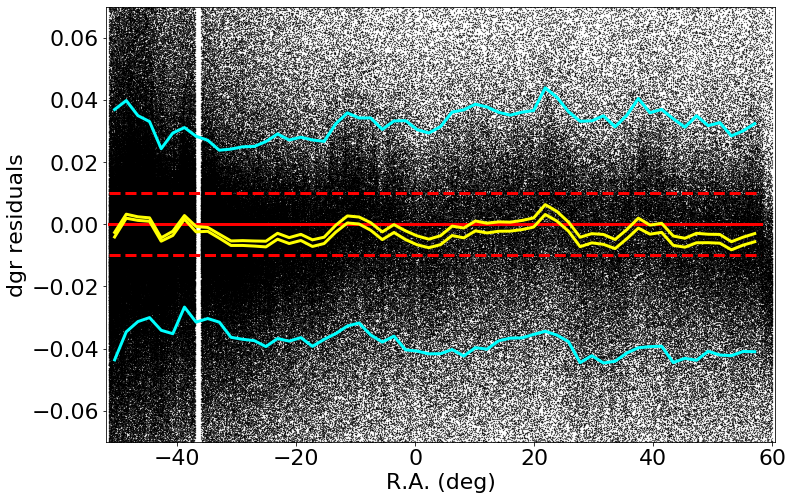

made plot colorResidPS_dgr_RA.png
-----------
 stats for Dec binning medians:
medianAll: -0.00245199999999917 std.dev.All: 0.034324602000003694
N= 897590 min= -0.29999999999999716 max= 0.29999999999999766
median: -0.002599999999998031 std.dev: 0.0008626284680496569
saved plot as: colorResidPS_dgr_Dec.png


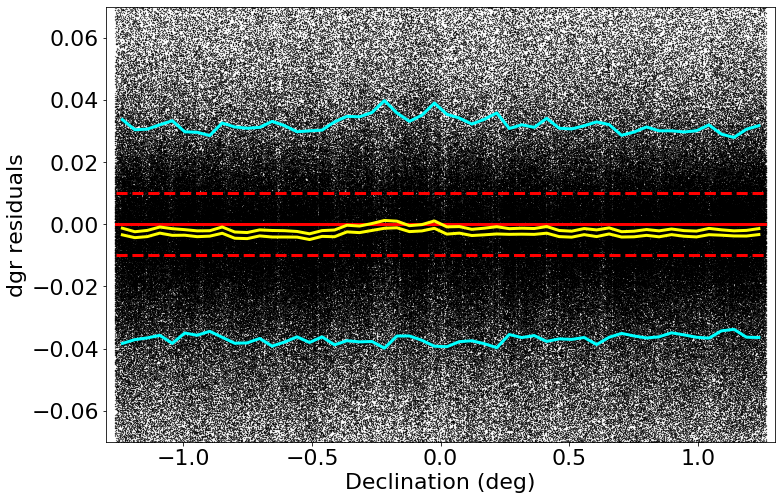

made plot colorResidPS_dgr_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: -0.00245199999999917 std.dev.All: 0.034324602000003694
N= 897590 min= -0.29999999999999716 max= 0.29999999999999766
median: -0.004134000000002247 std.dev: 0.03864681538419678
saved plot as: colorResidPS_dgr_rmag.png


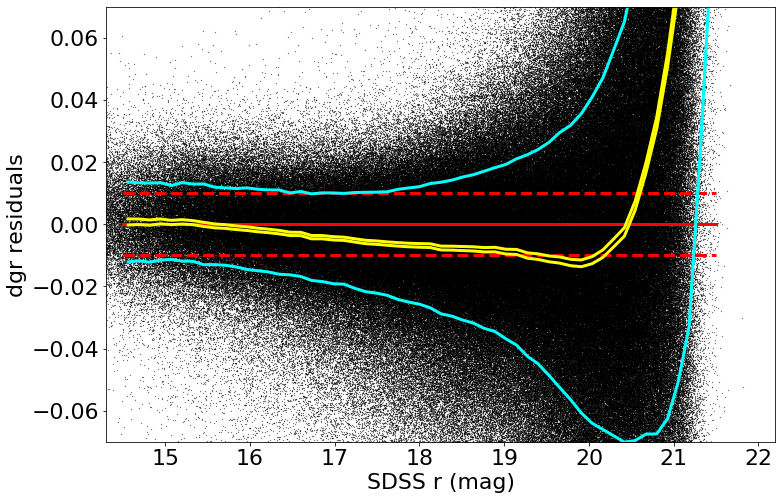

made plot colorResidPS_dgr_rmag.png
------------------------------------------------------------------
=========== WORKING ON: dri ===================
 stats for RA binning medians:
medianAll: -9.999999999976694e-05 std.dev.All: 0.01982471399999876
N= 942023 min= -0.2999679999999996 max= 0.2992859999999939
median: 6.94999999997642e-05 std.dev: 0.0028195719911031244
saved plot as: colorResidPS_dri_RA.png


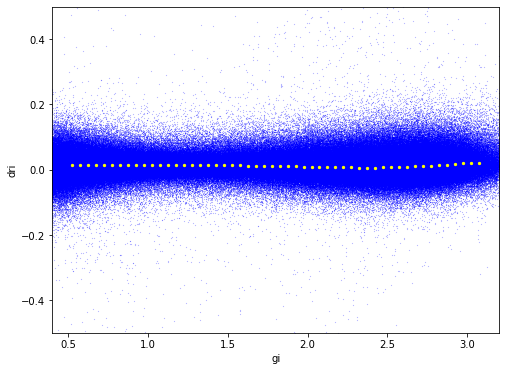

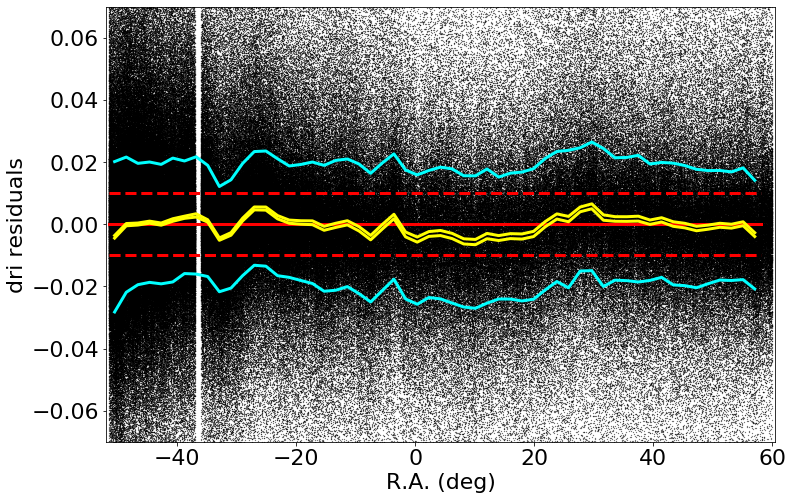

made plot colorResidPS_dri_RA.png
-----------
 stats for Dec binning medians:
medianAll: -9.999999999976694e-05 std.dev.All: 0.01982471399999876
N= 942023 min= -0.2999679999999996 max= 0.2992859999999939
median: 7.499999998517807e-06 std.dev: 0.0007985782642186863
saved plot as: colorResidPS_dri_Dec.png


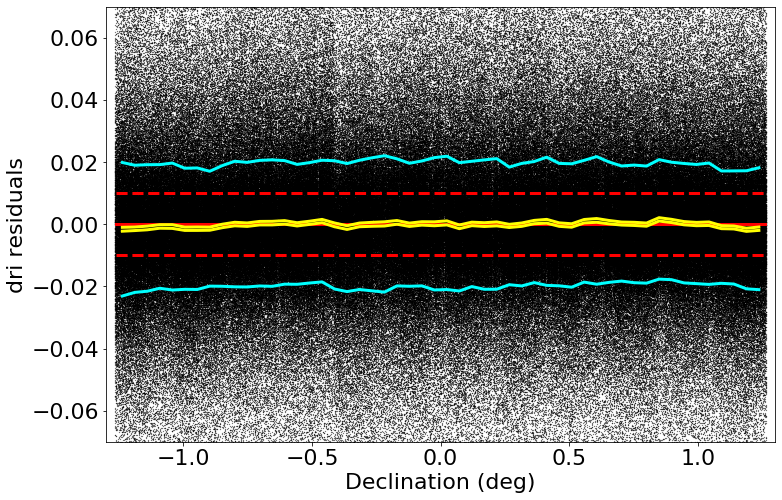

made plot colorResidPS_dri_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: -9.999999999976694e-05 std.dev.All: 0.01982471399999876
N= 942023 min= -0.2999679999999996 max= 0.2992859999999939
median: -0.0008149999999966925 std.dev: 0.005847724814047366
saved plot as: colorResidPS_dri_rmag.png


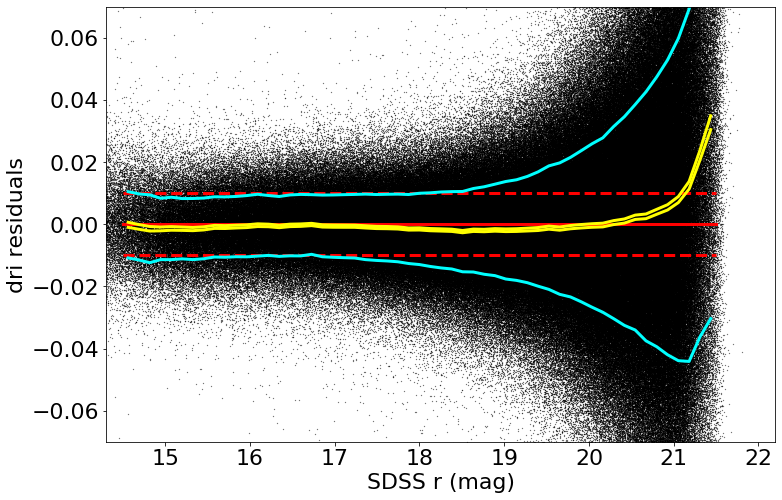

made plot colorResidPS_dri_rmag.png
------------------------------------------------------------------
=========== WORKING ON: diz ===================
 stats for RA binning medians:
medianAll: 4.800000000107496e-05 std.dev.All: 0.023880948000002206
N= 939585 min= -0.29999999999999716 max= 0.29995599999999834
median: 0.001324999999997422 std.dev: 0.005147142710935748
saved plot as: colorResidPS_diz_RA.png


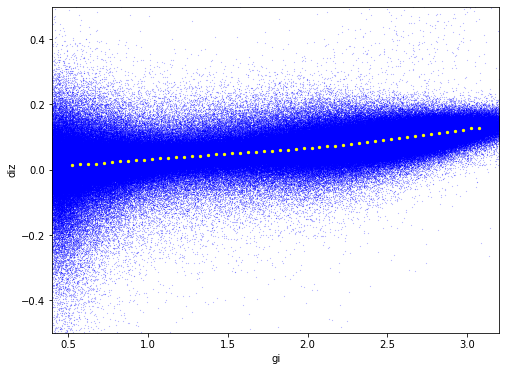

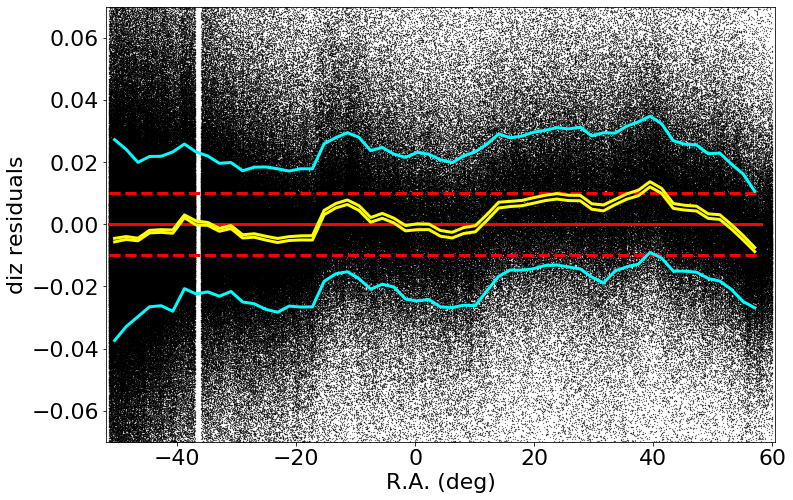

made plot colorResidPS_diz_RA.png
-----------
 stats for Dec binning medians:
medianAll: 4.800000000107496e-05 std.dev.All: 0.023880948000002206
N= 939585 min= -0.29999999999999716 max= 0.29995599999999834
median: 2.1499999996128782e-05 std.dev: 0.0012522584595963896
saved plot as: colorResidPS_diz_Dec.png


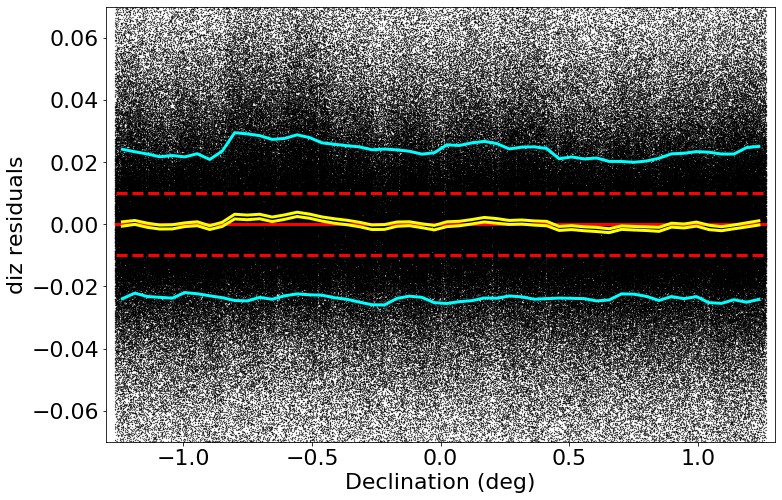

made plot colorResidPS_diz_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: 4.800000000107496e-05 std.dev.All: 0.023880948000002206
N= 939585 min= -0.29999999999999716 max= 0.29995599999999834
median: 0.0006700000000033207 std.dev: 0.0028233650484880217
saved plot as: colorResidPS_diz_rmag.png


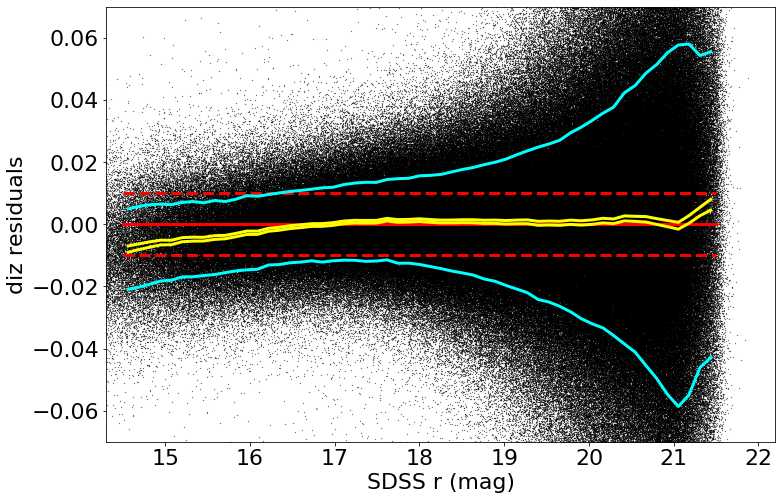

made plot colorResidPS_diz_rmag.png
------------------------------------------------------------------


In [39]:
keywords = {"Xstr":'gi', "plotNameRoot":'colorResidPS_', "symbSize":0.05}
for color in ('dg', 'dr', 'di', 'dz', 'dgr', 'dri', 'diz'):
    keywords["Ystr"] = color 
    doOneColor(sdssPS, keywords)

In [37]:
sdssPSbright = sdssPS[sdssPS['r_mMed']<20]
print(np.size(sdssPS), np.size(sdssPSbright))

943185 547069


=========== WORKING ON: dg ===================
 stats for RA binning medians:
medianAll: -0.00042000000000191884 std.dev.All: 0.0171971279999991
N= 545684 min= -0.29960000000000164 max= 0.29979999999999885
median: 0.0003729999999994571 std.dev: 0.002846344461572626
saved plot as: colorResidPSbright_dg_RA.png


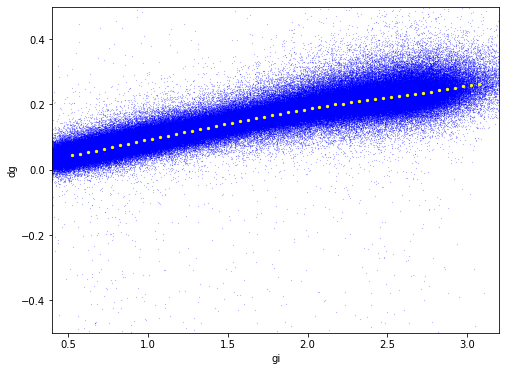

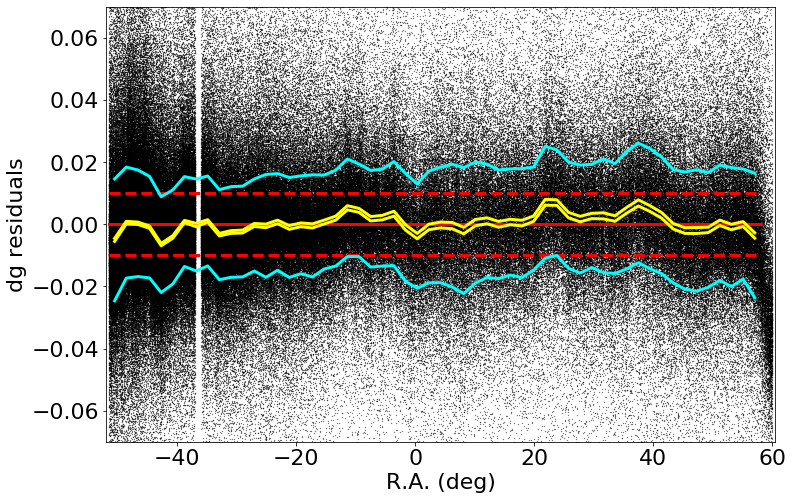

made plot colorResidPSbright_dg_RA.png
-----------
 stats for Dec binning medians:
medianAll: -0.00042000000000191884 std.dev.All: 0.0171971279999991
N= 545684 min= -0.29960000000000164 max= 0.29979999999999885
median: -0.0002700000000024332 std.dev: 0.0010508985305116333
saved plot as: colorResidPSbright_dg_Dec.png


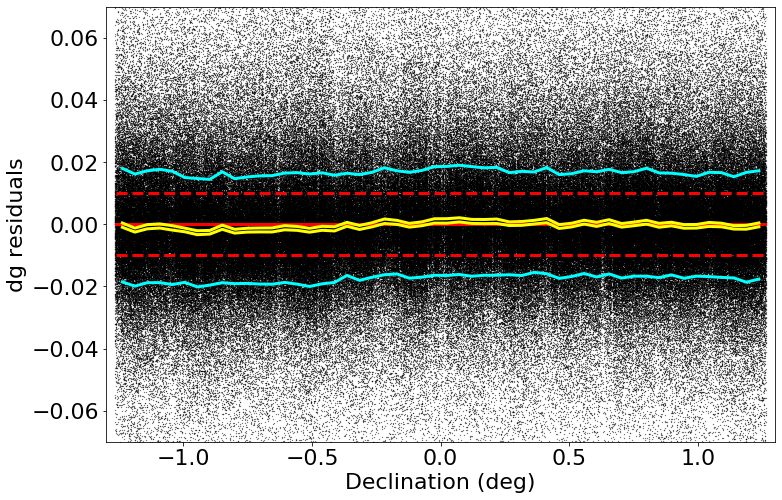

made plot colorResidPSbright_dg_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: -0.00042000000000191884 std.dev.All: 0.0171971279999991
N= 545684 min= -0.29960000000000164 max= 0.29979999999999885
median: -0.0016350000000018468 std.dev: 0.0035404838244595636
saved plot as: colorResidPSbright_dg_rmag.png


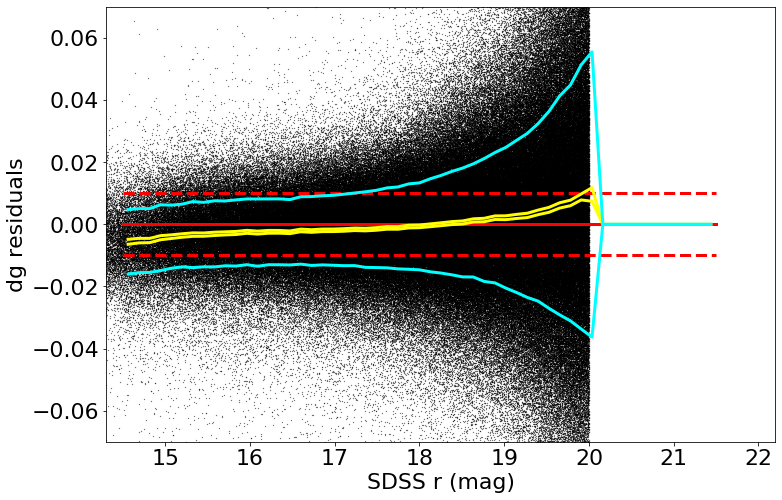

made plot colorResidPSbright_dg_rmag.png
------------------------------------------------------------------
=========== WORKING ON: dr ===================
 stats for RA binning medians:
medianAll: 6.399999999984977e-05 std.dev.All: 0.011626289999999232
N= 545821 min= -0.2999039999999974 max= 0.29672000000000026
median: 9.799999999903072e-05 std.dev: 0.0023807043200767325
saved plot as: colorResidPSbright_dr_RA.png


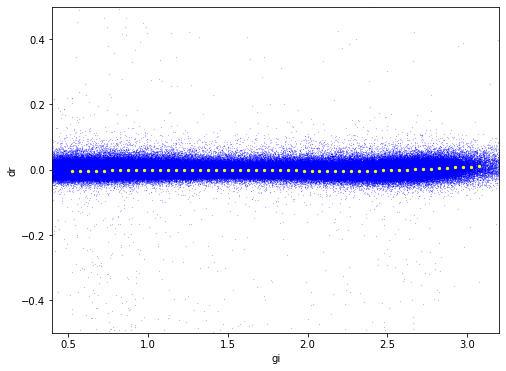

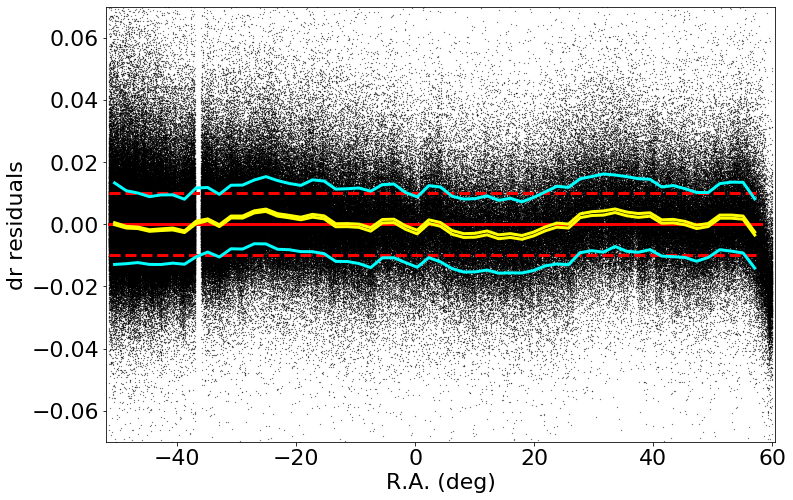

made plot colorResidPSbright_dr_RA.png
-----------
 stats for Dec binning medians:
medianAll: 6.399999999984977e-05 std.dev.All: 0.011626289999999232
N= 545821 min= -0.2999039999999974 max= 0.29672000000000026
median: 0.00011649999999996445 std.dev: 0.0006186717976251657
saved plot as: colorResidPSbright_dr_Dec.png


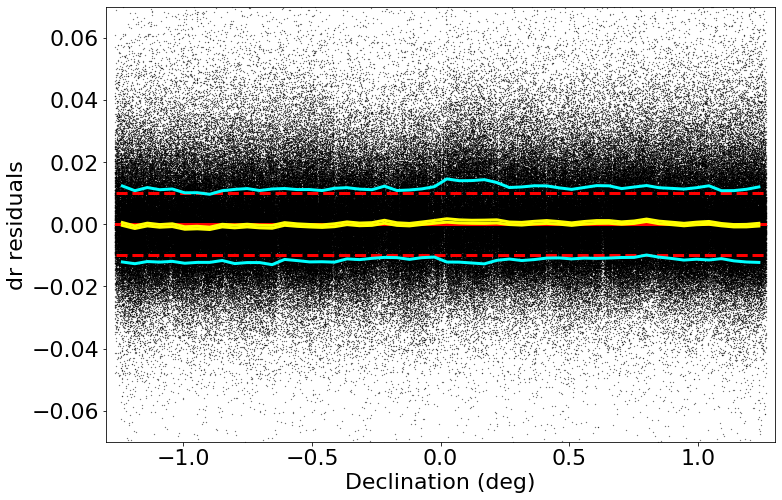

made plot colorResidPSbright_dr_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: 6.399999999984977e-05 std.dev.All: 0.011626289999999232
N= 545821 min= -0.2999039999999974 max= 0.29672000000000026
median: -0.0002844999999996379 std.dev: 0.00361376796149385
saved plot as: colorResidPSbright_dr_rmag.png


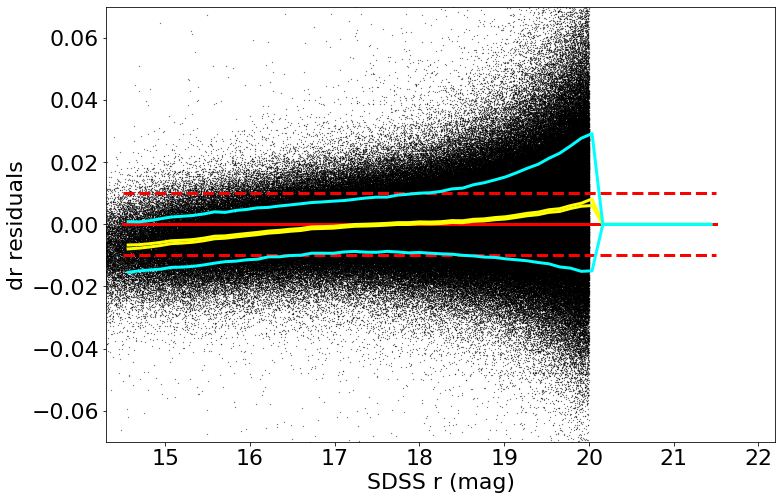

made plot colorResidPSbright_dr_rmag.png
------------------------------------------------------------------
=========== WORKING ON: di ===================
 stats for RA binning medians:
medianAll: 9.199999999972425e-05 std.dev.All: 0.010086491999998662
N= 545752 min= -0.2993919999999997 max= 0.29924599999999957
median: 0.0005279999999994187 std.dev: 0.0020357996692619766
saved plot as: colorResidPSbright_di_RA.png


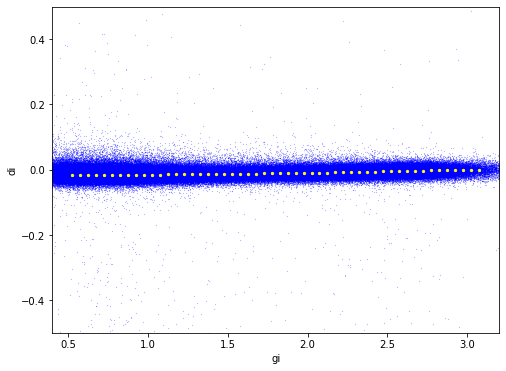

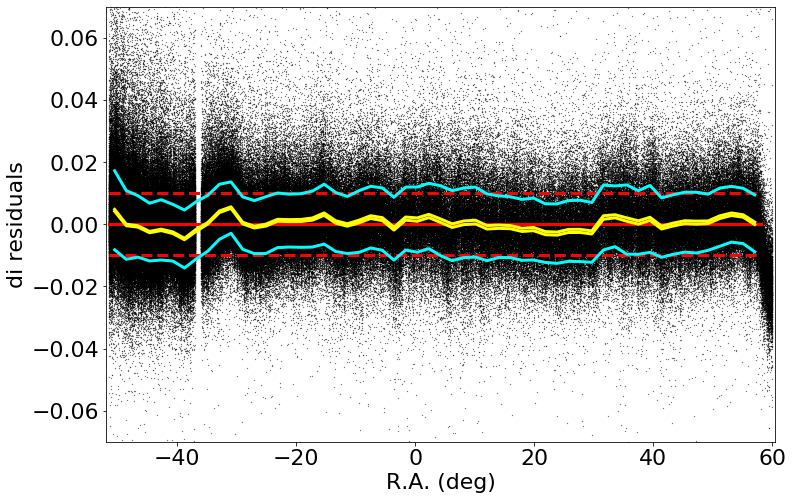

made plot colorResidPSbright_di_RA.png
-----------
 stats for Dec binning medians:
medianAll: 9.199999999972425e-05 std.dev.All: 0.010086491999998662
N= 545752 min= -0.2993919999999997 max= 0.29924599999999957
median: 7.000000000012899e-05 std.dev: 0.0007079634942365053
saved plot as: colorResidPSbright_di_Dec.png


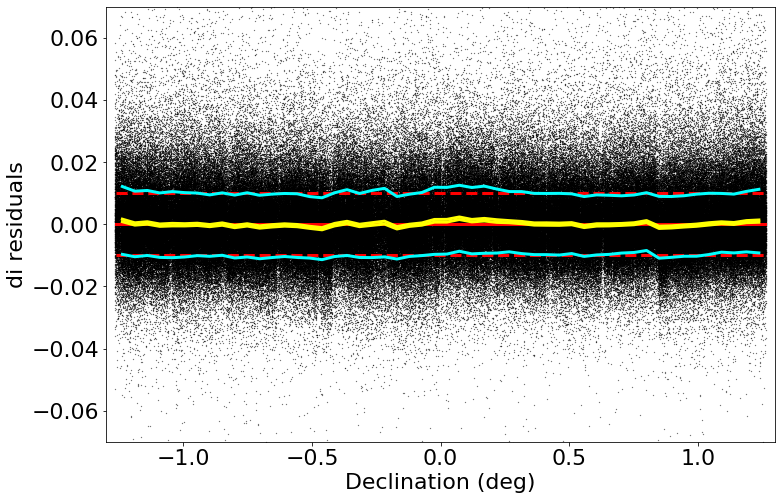

made plot colorResidPSbright_di_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: 9.199999999972425e-05 std.dev.All: 0.010086491999998662
N= 545752 min= -0.2993919999999997 max= 0.29924599999999957
median: -0.0005019999999989551 std.dev: 0.0030272253713153614
saved plot as: colorResidPSbright_di_rmag.png


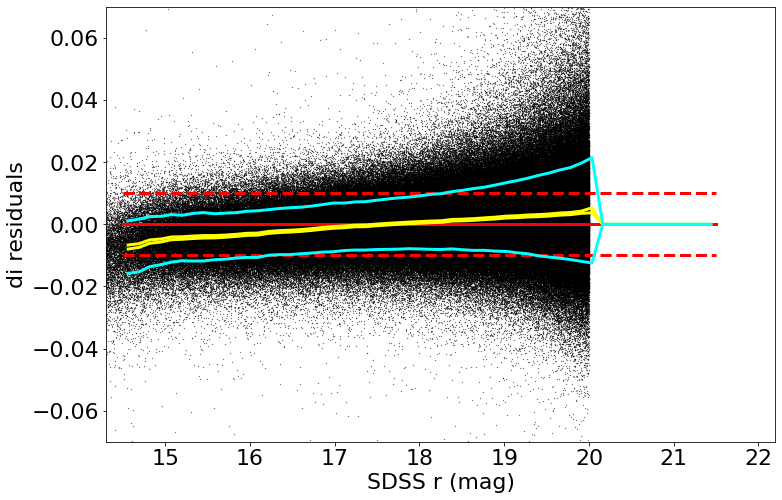

made plot colorResidPSbright_di_rmag.png
------------------------------------------------------------------
=========== WORKING ON: dz ===================
 stats for RA binning medians:
medianAll: 0.00015599999999946212 std.dev.All: 0.01535500200000173
N= 545748 min= -0.2998080000000021 max= 0.29802500000000015
median: -0.0003715000000005745 std.dev: 0.005754681449077496
saved plot as: colorResidPSbright_dz_RA.png


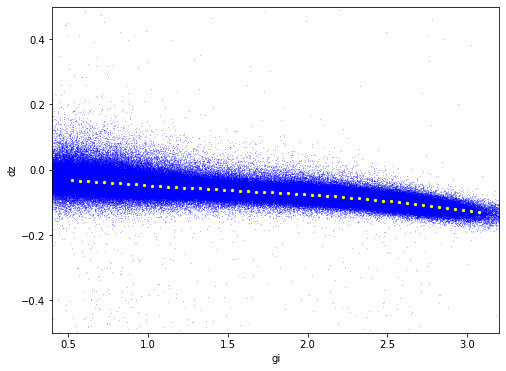

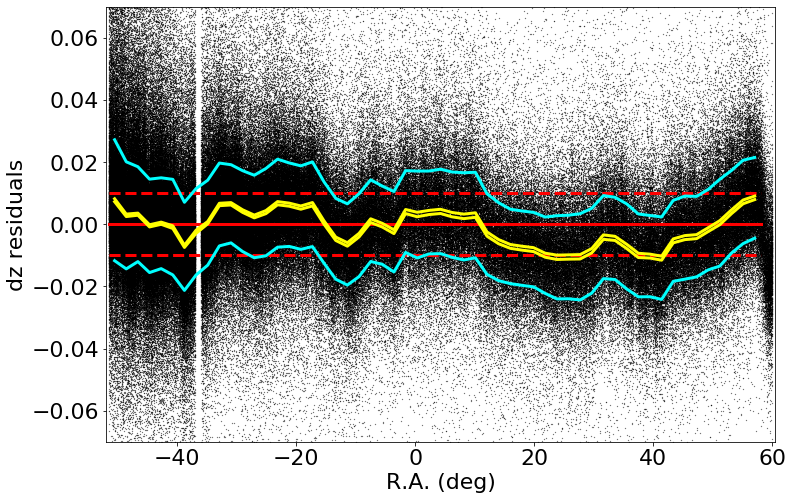

made plot colorResidPSbright_dz_RA.png
-----------
 stats for Dec binning medians:
medianAll: 0.00015599999999946212 std.dev.All: 0.01535500200000173
N= 545748 min= -0.2998080000000021 max= 0.29802500000000015
median: 8.650000000011253e-05 std.dev: 0.0008231537587135803
saved plot as: colorResidPSbright_dz_Dec.png


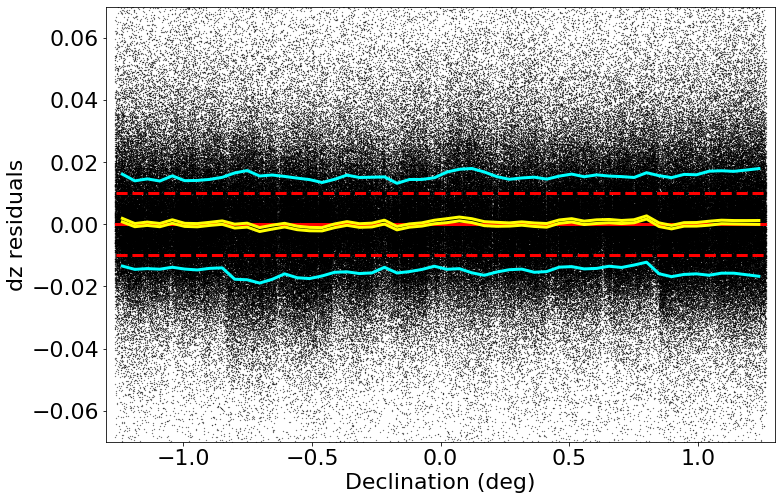

made plot colorResidPSbright_dz_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: 0.00015599999999946212 std.dev.All: 0.01535500200000173
N= 545748 min= -0.2998080000000021 max= 0.29802500000000015
median: 0.0003089999999992543 std.dev: 0.0011541222615485747
saved plot as: colorResidPSbright_dz_rmag.png


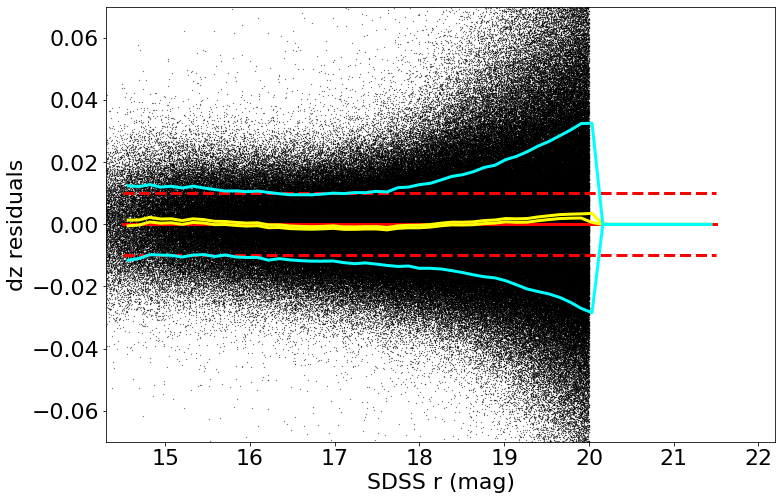

made plot colorResidPSbright_dz_rmag.png
------------------------------------------------------------------
=========== WORKING ON: dgr ===================
 stats for RA binning medians:
medianAll: -0.000525000000002121 std.dev.All: 0.018789536999997962
N= 546375 min= -0.29896000000000145 max= 0.29960000000000164
median: -0.00039549999999937725 std.dev: 0.0032390968376848493
saved plot as: colorResidPSbright_dgr_RA.png


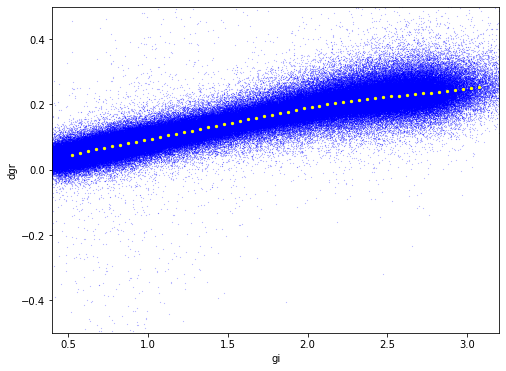

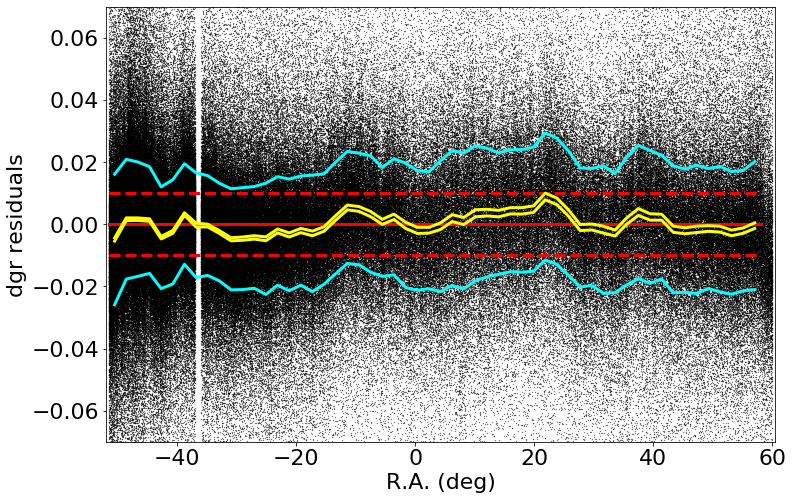

made plot colorResidPSbright_dgr_RA.png
-----------
 stats for Dec binning medians:
medianAll: -0.000525000000002121 std.dev.All: 0.018789536999997962
N= 546375 min= -0.29896000000000145 max= 0.29960000000000164
median: -0.000560000000002666 std.dev: 0.0006071972822491767
saved plot as: colorResidPSbright_dgr_Dec.png


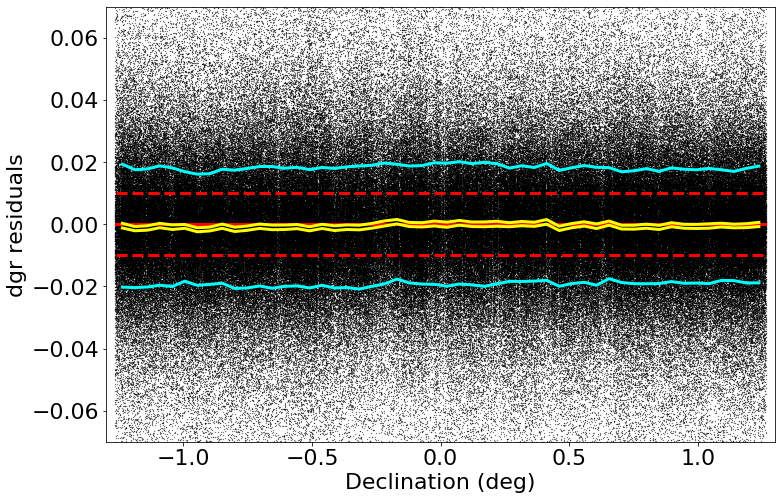

made plot colorResidPSbright_dgr_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: -0.000525000000002121 std.dev.All: 0.018789536999997962
N= 546375 min= -0.29896000000000145 max= 0.29960000000000164
median: -0.0005660000000013016 std.dev: 0.0012401483617152812
saved plot as: colorResidPSbright_dgr_rmag.png


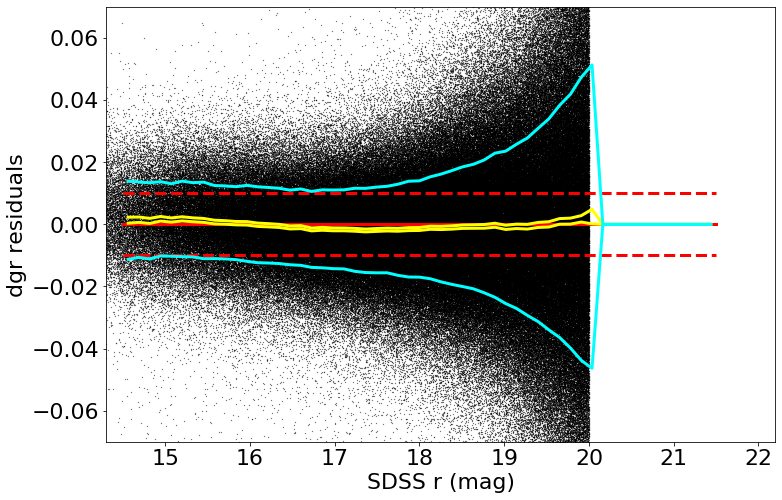

made plot colorResidPSbright_dgr_rmag.png
------------------------------------------------------------------
=========== WORKING ON: dri ===================
 stats for RA binning medians:
medianAll: -3.199999999724257e-05 std.dev.All: 0.013132002000000063
N= 546508 min= -0.29993599999999765 max= 0.2962100000000011
median: -1.8000000000321578e-05 std.dev: 0.0025281896010233744
saved plot as: colorResidPSbright_dri_RA.png


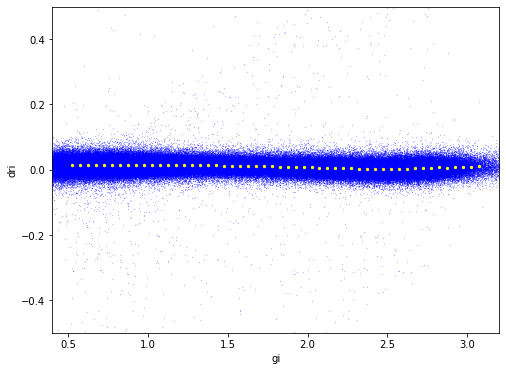

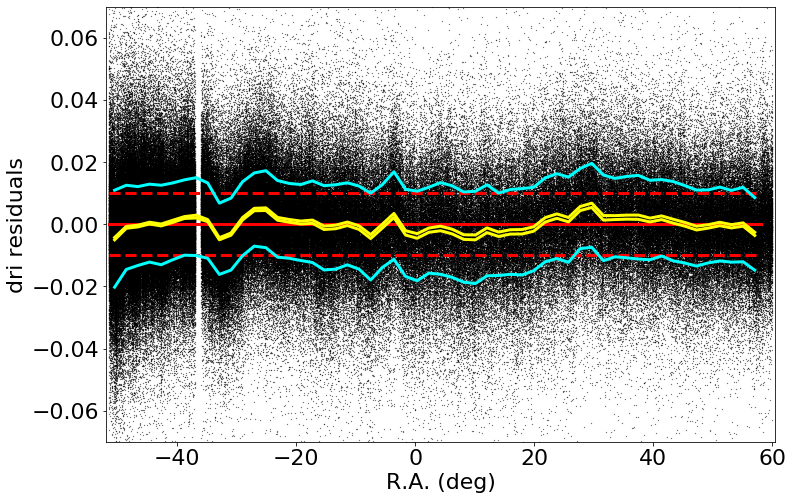

made plot colorResidPSbright_dri_RA.png
-----------
 stats for Dec binning medians:
medianAll: -3.199999999724257e-05 std.dev.All: 0.013132002000000063
N= 546508 min= -0.29993599999999765 max= 0.2962100000000011
median: 2.4749999998223242e-05 std.dev: 0.0006637713891848575
saved plot as: colorResidPSbright_dri_Dec.png


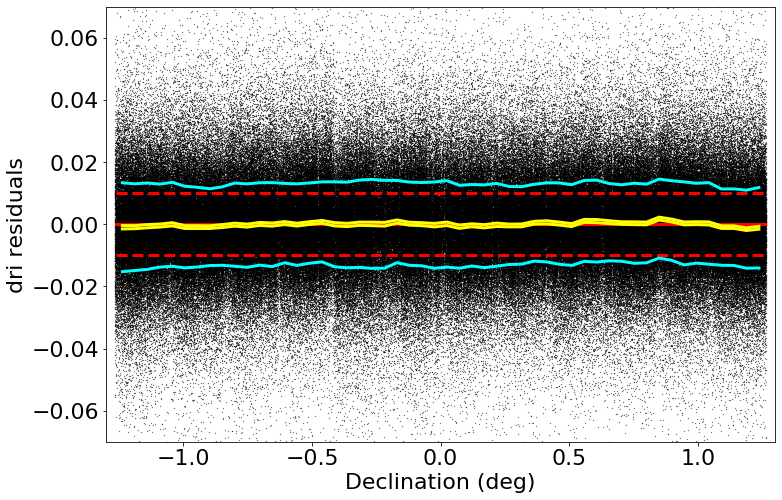

made plot colorResidPSbright_dri_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: -3.199999999724257e-05 std.dev.All: 0.013132002000000063
N= 546508 min= -0.29993599999999765 max= 0.2962100000000011
median: -0.0001584999999991708 std.dev: 0.0006896299038709354
saved plot as: colorResidPSbright_dri_rmag.png


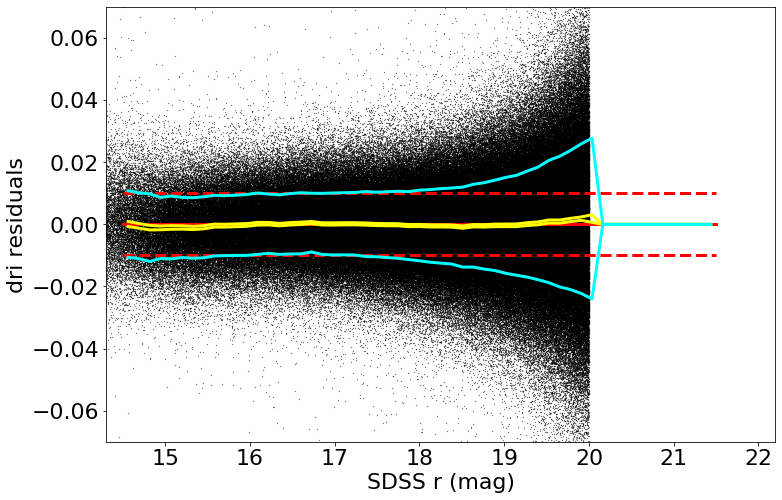

made plot colorResidPSbright_dri_rmag.png
------------------------------------------------------------------
=========== WORKING ON: diz ===================
 stats for RA binning medians:
medianAll: -6.000000000179126e-05 std.dev.All: 0.01666064399999882
N= 546760 min= -0.298499999999998 max= 0.2980080000000021
median: 0.0007194999999986787 std.dev: 0.004909072363137593
saved plot as: colorResidPSbright_diz_RA.png


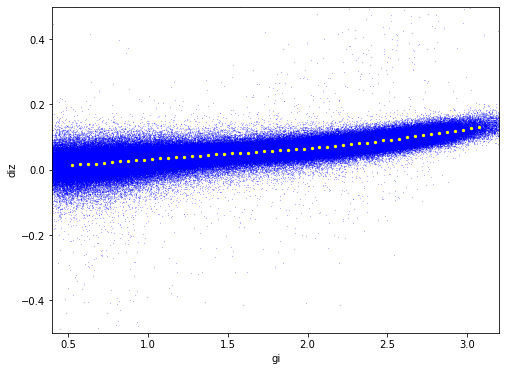

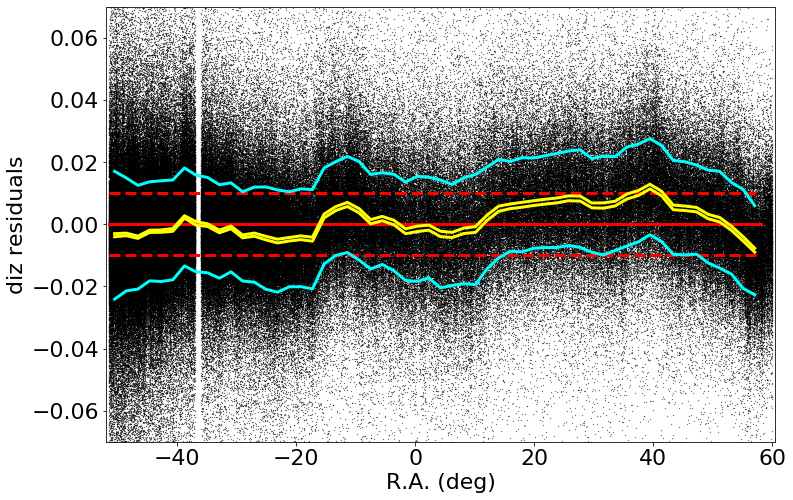

made plot colorResidPSbright_diz_RA.png
-----------
 stats for Dec binning medians:
medianAll: -6.000000000179126e-05 std.dev.All: 0.01666064399999882
N= 546760 min= -0.298499999999998 max= 0.2980080000000021
median: 3.300000000093072e-05 std.dev: 0.000595088793036595
saved plot as: colorResidPSbright_diz_Dec.png


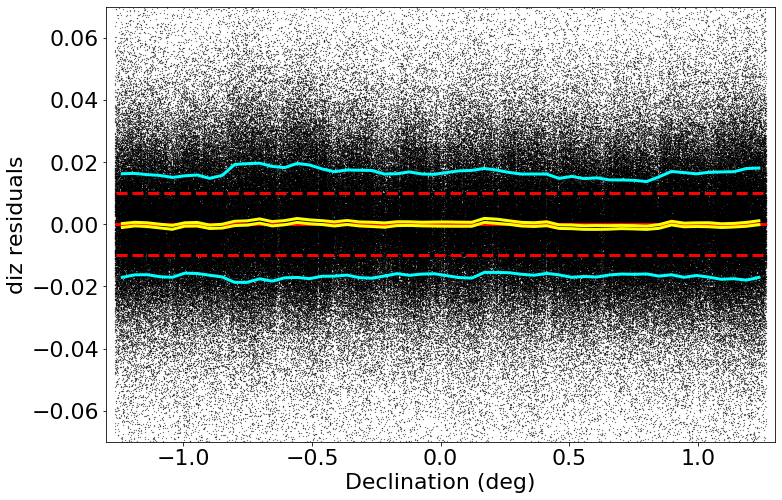

made plot colorResidPSbright_diz_Dec.png
-----------
 stats for SDSS r binning medians:
medianAll: -6.000000000179126e-05 std.dev.All: 0.01666064399999882
N= 546760 min= -0.298499999999998 max= 0.2980080000000021
median: 0.0007339999999979516 std.dev: 0.0028293372928179608
saved plot as: colorResidPSbright_diz_rmag.png


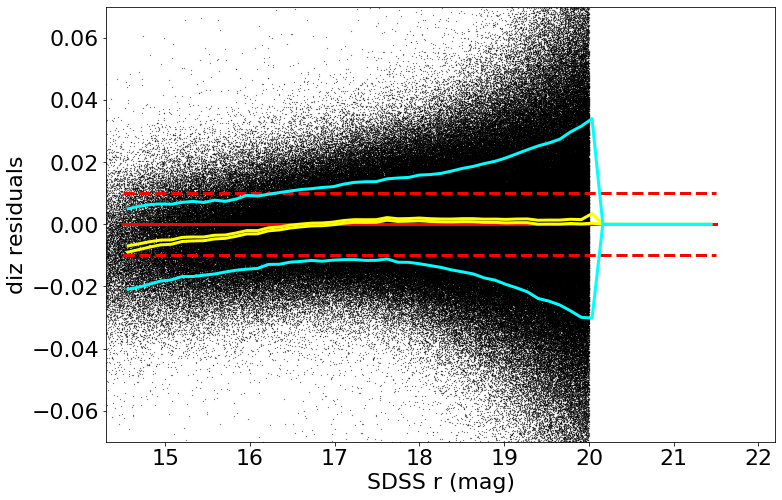

made plot colorResidPSbright_diz_rmag.png
------------------------------------------------------------------


In [38]:
keywords = {"Xstr":'gi', "plotNameRoot":'colorResidPSbright_', "symbSize":0.05}
for color in ('dg', 'dr', 'di', 'dz', 'dgr', 'dri', 'diz'):
    keywords["Ystr"] = color 
    doOneColor(sdssPSbright, keywords)